In [810]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import numpy as np

import pandas as pd

import matplotlib.pyplot as plt

%matplotlib inline

from sklearn.ensemble import IsolationForest


NameError: name '_private' is not defined

In [742]:
df=pd.read_csv('rawdata.csv')
df

,id,date,time,continent_code,country_name,country_code,state/province,population,city/town,distance,location_description,geolocation,hazard_type,landslide_type,landslide_size,trigger,storm_name,injuries,fatalities,source_name,source_link
0,34,3/2/2007,Night,NaN,United States,US,Virginia,16000,Cherry Hill,3.40765,Unknown,"(38.6009, -77.2682)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,NBC 4 news,http://www.nbc4.com/news/11186871/detail.html
1,42,3/22/2007,NaN,NaN,United States,US,Ohio,17288,New Philadelphia,3.33522,NaN,"(40.5175, -81.4305)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Canton Rep.com,http://www.cantonrep.com/index.php?ID=345054&C...
2,56,4/6/2007,NaN,NaN,United States,US,Pennsylvania,15930,Wilkinsburg,2.91977,Urban area,"(40.4377, -79.916)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,The Pittsburgh Channel.com,https://web.archive.org/web/20080423132842/htt...
3,59,4/14/2007,NaN,NaN,Canada,CA,Quebec,42786,Châteauguay,2.98682,Above river,"(45.3226, -73.7771)",Landslide,Riverbank collapse,Small,Rain,NaN,NaN,NaN,Le Soleil,http://www.hebdos.net/lsc/edition162007/articl...
4,61,4/15/2007,NaN,NaN,United States,US,Kentucky,6903,Pikeville,5.66542,Below road,"(37.4325, -82.4931)",Landslide,Landslide,Small,Downpour,NaN,NaN,0.0,Matthew Crawford (KGS),NaN
5,64,4/20/2007,NaN,NaN,United States,US,Kentucky,6903,Pikeville,0.23715,NaN,"(37.4814, -82.5186)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Applalachain news-express,http://www.news-expressky.com/articles/2007/04...
6,67,4/24/2007,NaN,NaN,United States,US,South Dakota,2540,Dakota Dunes,2.48033,NaN,"(42.4941, -96.4576)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Sioux City Journnal,http://www.siouxcityjournal.com/articles/2007/...
7,77,5/21/2007,NaN,SA,Colombia,CO,Risaralda,440118,Pereira,0.62022,NaN,"(4.8081, -75.6941)",Landslide,Mudslide,Large,Rain,NaN,NaN,13.0,Reuters - AlertNet.org,http://www.reuters.com/news/video/videoStory?v...
8,105,6/27/2007,NaN,SA,Ecuador,EC,Zamora-Chinchipe,15276,Zamora,0.47714,NaN,"(-4.065, -78.951)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...
9,106,6/27/2007,NaN,SA,Ecuador,EC,Loja,117796,Loja,0.35649,NaN,"(-3.99, -79.205)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...


In [743]:
#1. How many rows and columns does the dataset contain
total_rows=len(df.axes[0]) #===> Axes of 0 is for a row
total_cols=len(df.axes[1]) #===> Axes of 1 is for a column
print("Number of Rows: "+str(total_rows))
print("Number of Columns: "+str(total_cols))

Number of Rows: 1693
Number of Columns: 21


In [744]:
#2. Do you find any issue from this dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1693 entries, 0 to 1692
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    1693 non-null   int64  
 1   date                  1690 non-null   object 
 2   time                  629 non-null    object 
 3   continent_code        164 non-null    object 
 4   country_name          1693 non-null   object 
 5   country_code          1693 non-null   object 
 6   state/province        1692 non-null   object 
 7   population            1693 non-null   int64  
 8   city/town             1689 non-null   object 
 9   distance              1692 non-null   float64
 10  location_description  551 non-null    object 
 11  geolocation           1693 non-null   object 
 12  hazard_type           1693 non-null   object 
 13  landslide_type        1692 non-null   object 
 14  landslide_size        1692 non-null   object 
 15  trigger              

In [745]:
print(df.isnull().sum())

id                         0
date                       3
time                    1064
continent_code          1529
country_name               0
country_code               0
state/province             1
population                 0
city/town                  4
distance                   1
location_description    1142
geolocation                0
hazard_type                0
landslide_type             1
landslide_size             1
trigger                    2
storm_name              1561
injuries                1178
fatalities               247
source_name              821
source_link              100
dtype: int64


In [746]:
percent_missing = (df.isnull().sum().sort_values(ascending = False) * 100 / len(df)).round(2)
percent_missing

storm_name              92.20
continent_code          90.31
injuries                69.58
location_description    67.45
time                    62.85
source_name             48.49
fatalities              14.59
source_link              5.91
city/town                0.24
date                     0.18
trigger                  0.12
distance                 0.06
landslide_type           0.06
landslide_size           0.06
state/province           0.06
geolocation              0.00
hazard_type              0.00
population               0.00
country_code             0.00
country_name             0.00
id                       0.00
dtype: float64

<Figure size 720x432 with 0 Axes>

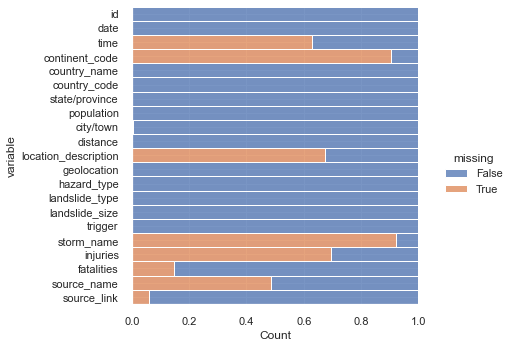

In [747]:
plt.figure(figsize=(10,6))
sns.displot(
    data=df.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25
)
plt.savefig("visualizing_missing_data_with_barplot_Seaborn_distplot.png", dpi=100)

<AxesSubplot:>

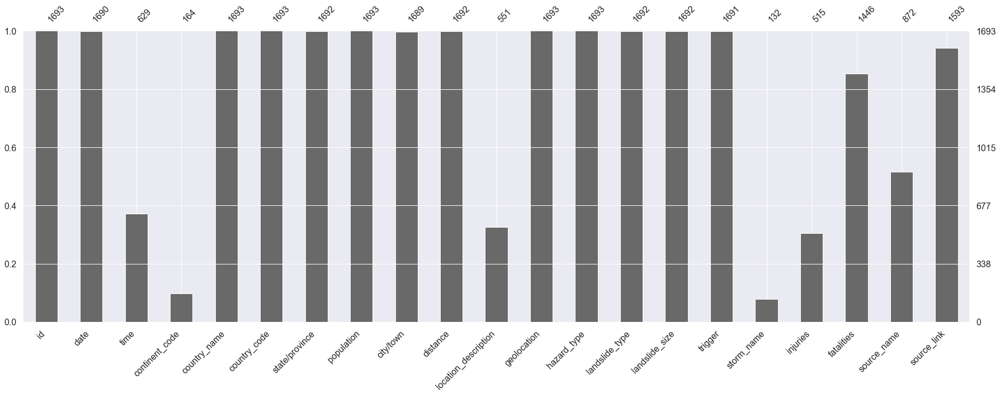

In [748]:
# Import missingno as msno
import missingno as msno

# Plot amount of missingness
msno.bar(df)

In [749]:
#5.if missing value occur in the dataset, what method will you use to handle them

In [750]:
#6.how do you treat "date" column ?
#convert start_date to DateTime format
df['date'] = pd.to_datetime(df['date'], format='%m/%d/%Y')
df


,id,date,time,continent_code,country_name,country_code,state/province,population,city/town,distance,location_description,geolocation,hazard_type,landslide_type,landslide_size,trigger,storm_name,injuries,fatalities,source_name,source_link
0,34,2007-03-02,Night,NaN,United States,US,Virginia,16000,Cherry Hill,3.40765,Unknown,"(38.6009, -77.2682)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,NBC 4 news,http://www.nbc4.com/news/11186871/detail.html
1,42,2007-03-22,NaN,NaN,United States,US,Ohio,17288,New Philadelphia,3.33522,NaN,"(40.5175, -81.4305)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Canton Rep.com,http://www.cantonrep.com/index.php?ID=345054&C...
2,56,2007-04-06,NaN,NaN,United States,US,Pennsylvania,15930,Wilkinsburg,2.91977,Urban area,"(40.4377, -79.916)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,The Pittsburgh Channel.com,https://web.archive.org/web/20080423132842/htt...
3,59,2007-04-14,NaN,NaN,Canada,CA,Quebec,42786,Châteauguay,2.98682,Above river,"(45.3226, -73.7771)",Landslide,Riverbank collapse,Small,Rain,NaN,NaN,NaN,Le Soleil,http://www.hebdos.net/lsc/edition162007/articl...
4,61,2007-04-15,NaN,NaN,United States,US,Kentucky,6903,Pikeville,5.66542,Below road,"(37.4325, -82.4931)",Landslide,Landslide,Small,Downpour,NaN,NaN,0.0,Matthew Crawford (KGS),NaN
5,64,2007-04-20,NaN,NaN,United States,US,Kentucky,6903,Pikeville,0.23715,NaN,"(37.4814, -82.5186)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Applalachain news-express,http://www.news-expressky.com/articles/2007/04...
6,67,2007-04-24,NaN,NaN,United States,US,South Dakota,2540,Dakota Dunes,2.48033,NaN,"(42.4941, -96.4576)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Sioux City Journnal,http://www.siouxcityjournal.com/articles/2007/...
7,77,2007-05-21,NaN,SA,Colombia,CO,Risaralda,440118,Pereira,0.62022,NaN,"(4.8081, -75.6941)",Landslide,Mudslide,Large,Rain,NaN,NaN,13.0,Reuters - AlertNet.org,http://www.reuters.com/news/video/videoStory?v...
8,105,2007-06-27,NaN,SA,Ecuador,EC,Zamora-Chinchipe,15276,Zamora,0.47714,NaN,"(-4.065, -78.951)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...
9,106,2007-06-27,NaN,SA,Ecuador,EC,Loja,117796,Loja,0.35649,NaN,"(-3.99, -79.205)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...


In [751]:
#which is the oldest date, the newest date and their range in days, month, quarters and years
list_of_dates= df['date']

print(min(list_of_dates)) # oldest date
print(max(list_of_dates)) # newest date

2007-03-02 00:00:00
2016-03-02 00:00:00


In [752]:
df_dates = pd.DataFrame()
df_dates["daten"]=pd.Series(list_of_dates)
df_dates 

,daten
0,2007-03-02
1,2007-03-22
2,2007-04-06
3,2007-04-14
4,2007-04-15
5,2007-04-20
6,2007-04-24
7,2007-05-21
8,2007-06-27
9,2007-06-27


In [753]:
df_dates["daten"] = pd.to_datetime(df_dates["daten"])
# add a column for Year
df_dates['Year'] = df_dates["daten"].dt.year
df_dates['Quarter'] = df_dates["daten"].dt.quarter
df_dates['Month'] = df_dates["daten"].dt.month
df_dates['Day'] = df_dates["daten"].dt.day

df_dates

,daten,Year,Quarter,Month,Day
0,2007-03-02,2007.0,1.0,3.0,2.0
1,2007-03-22,2007.0,1.0,3.0,22.0
2,2007-04-06,2007.0,2.0,4.0,6.0
3,2007-04-14,2007.0,2.0,4.0,14.0
4,2007-04-15,2007.0,2.0,4.0,15.0
5,2007-04-20,2007.0,2.0,4.0,20.0
6,2007-04-24,2007.0,2.0,4.0,24.0
7,2007-05-21,2007.0,2.0,5.0,21.0
8,2007-06-27,2007.0,2.0,6.0,27.0
9,2007-06-27,2007.0,2.0,6.0,27.0


In [754]:
#their range in days, month, quarters and years
print('range of day old:',min(df_dates['Day'])) # oldest day
print('range of day new:',max(df_dates['Day'])) # newest day

print('range of month old:',min(df_dates['Month'])) # oldest month
print('range of month new:',max(df_dates['Month'])) # newest month

print('range of quarter old:',min(df_dates['Quarter'])) # oldest quarter
print('range of quarter new:',max(df_dates['Quarter'])) # newest quarter

range of day old: 1.0
range of day new: 31.0
range of month old: 1.0
range of month new: 12.0
range of quarter old: 1.0
range of quarter new: 4.0


In [755]:
print("newest Quarter of year:",df_dates.groupby(['Year'])['Quarter'].max())
print("smallest Quarter of year:",df_dates.groupby(['Year'])['Quarter'].min())

newest Quarter of year: Year
2007.0    4.0
2008.0    4.0
2009.0    4.0
2010.0    4.0
2011.0    4.0
2012.0    4.0
2013.0    4.0
2014.0    4.0
2015.0    4.0
2016.0    1.0
Name: Quarter, dtype: float64
smallest Quarter of year: Year
2007.0    1.0
2008.0    1.0
2009.0    1.0
2010.0    1.0
2011.0    1.0
2012.0    1.0
2013.0    1.0
2014.0    1.0
2015.0    1.0
2016.0    1.0
Name: Quarter, dtype: float64


In [756]:
print("newest month of year:",df_dates.groupby(['Year'])['Month'].max())
print("smallest month of year:",df_dates.groupby(['Year'])['Month'].min())

newest month of year: Year
2007.0    12.0
2008.0    12.0
2009.0    12.0
2010.0    12.0
2011.0    12.0
2012.0    12.0
2013.0    12.0
2014.0    12.0
2015.0    12.0
2016.0     3.0
Name: Month, dtype: float64
smallest month of year: Year
2007.0    3.0
2008.0    1.0
2009.0    1.0
2010.0    1.0
2011.0    1.0
2012.0    1.0
2013.0    1.0
2014.0    1.0
2015.0    1.0
2016.0    1.0
Name: Month, dtype: float64


In [757]:
print("newest day of month:",df_dates.groupby(['Month'])['Day'].max())
print("smallest day of month:",df_dates.groupby(['Month'])['Day'].min())

newest day of month: Month
1.0     30.0
2.0     28.0
3.0     31.0
4.0     30.0
5.0     31.0
6.0     30.0
7.0     31.0
8.0     31.0
9.0     30.0
10.0    31.0
11.0    30.0
12.0    30.0
Name: Day, dtype: float64
smallest day of month: Month
1.0     1.0
2.0     1.0
3.0     2.0
4.0     1.0
5.0     1.0
6.0     1.0
7.0     1.0
8.0     1.0
9.0     1.0
10.0    1.0
11.0    1.0
12.0    1.0
Name: Day, dtype: float64


In [758]:
date1 = pd.Timestamp(datetime.now()) #CURRENT_DATE
date2 = max(list_of_dates)#NEWEST_DATE

dt_day = date1.to_period('D') - date2.to_period('D')
print(dt)

<2412 * Days>


In [759]:
dt_months = date1.to_period('M') - date2.to_period('M')
dt_months

<79 * MonthEnds>

In [760]:
dt_quarter = date1.to_period('Q') - date2.to_period('Q')
dt_quarter

<27 * QuarterEnds: startingMonth=12>

In [761]:
dt_years = date1.to_period('Y') - date2.to_period('Y')
dt_years

<6 * YearEnds: month=12>

In [762]:
#Do you find any invalid GPS coordinate ("geolocation") in the given dataset
#given latitude must be within [-90,90] and longitude must with [-180,180]
pd.set_option('display.max_columns', None,'display.max_rows', None)
df

,id,date,time,continent_code,country_name,country_code,state/province,population,city/town,distance,location_description,geolocation,hazard_type,landslide_type,landslide_size,trigger,storm_name,injuries,fatalities,source_name,source_link
0,34,2007-03-02,Night,NaN,United States,US,Virginia,16000,Cherry Hill,3.40765,Unknown,"(38.6009, -77.2682)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,NBC 4 news,http://www.nbc4.com/news/11186871/detail.html
1,42,2007-03-22,NaN,NaN,United States,US,Ohio,17288,New Philadelphia,3.33522,NaN,"(40.5175, -81.4305)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Canton Rep.com,http://www.cantonrep.com/index.php?ID=345054&C...
2,56,2007-04-06,NaN,NaN,United States,US,Pennsylvania,15930,Wilkinsburg,2.91977,Urban area,"(40.4377, -79.916)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,The Pittsburgh Channel.com,https://web.archive.org/web/20080423132842/htt...
3,59,2007-04-14,NaN,NaN,Canada,CA,Quebec,42786,Châteauguay,2.98682,Above river,"(45.3226, -73.7771)",Landslide,Riverbank collapse,Small,Rain,NaN,NaN,NaN,Le Soleil,http://www.hebdos.net/lsc/edition162007/articl...
4,61,2007-04-15,NaN,NaN,United States,US,Kentucky,6903,Pikeville,5.66542,Below road,"(37.4325, -82.4931)",Landslide,Landslide,Small,Downpour,NaN,NaN,0.0,Matthew Crawford (KGS),NaN
5,64,2007-04-20,NaN,NaN,United States,US,Kentucky,6903,Pikeville,0.23715,NaN,"(37.4814, -82.5186)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Applalachain news-express,http://www.news-expressky.com/articles/2007/04...
6,67,2007-04-24,NaN,NaN,United States,US,South Dakota,2540,Dakota Dunes,2.48033,NaN,"(42.4941, -96.4576)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Sioux City Journnal,http://www.siouxcityjournal.com/articles/2007/...
7,77,2007-05-21,NaN,SA,Colombia,CO,Risaralda,440118,Pereira,0.62022,NaN,"(4.8081, -75.6941)",Landslide,Mudslide,Large,Rain,NaN,NaN,13.0,Reuters - AlertNet.org,http://www.reuters.com/news/video/videoStory?v...
8,105,2007-06-27,NaN,SA,Ecuador,EC,Zamora-Chinchipe,15276,Zamora,0.47714,NaN,"(-4.065, -78.951)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...
9,106,2007-06-27,NaN,SA,Ecuador,EC,Loja,117796,Loja,0.35649,NaN,"(-3.99, -79.205)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...


In [763]:
df['latitude']=''
df['longitude']=''
for i in range (0,len(df)):
    df['latitude'][i]=df['geolocation'][i].split(',', 1)[0].split('(')[1]
    df['longitude'][i]=df['geolocation'][i].split(',', 1)[1].split(')')[0]

C:\Users\QLRR\AppData\Local\Temp/ipykernel_6044/3518131874.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['latitude'][i]=df['geolocation'][i].split(',', 1)[0].split('(')[1]
C:\Users\QLRR\AppData\Local\Temp/ipykernel_6044/3518131874.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['longitude'][i]=df['geolocation'][i].split(',', 1)[1].split(')')[0]


In [764]:
df

,id,date,time,continent_code,country_name,country_code,state/province,population,city/town,distance,location_description,geolocation,hazard_type,landslide_type,landslide_size,trigger,storm_name,injuries,fatalities,source_name,source_link,latitude,longitude
0,34,2007-03-02,Night,NaN,United States,US,Virginia,16000,Cherry Hill,3.40765,Unknown,"(38.6009, -77.2682)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,NBC 4 news,http://www.nbc4.com/news/11186871/detail.html,38.6009,-77.2682
1,42,2007-03-22,NaN,NaN,United States,US,Ohio,17288,New Philadelphia,3.33522,NaN,"(40.5175, -81.4305)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Canton Rep.com,http://www.cantonrep.com/index.php?ID=345054&C...,40.5175,-81.4305
2,56,2007-04-06,NaN,NaN,United States,US,Pennsylvania,15930,Wilkinsburg,2.91977,Urban area,"(40.4377, -79.916)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,The Pittsburgh Channel.com,https://web.archive.org/web/20080423132842/htt...,40.4377,-79.916
3,59,2007-04-14,NaN,NaN,Canada,CA,Quebec,42786,Châteauguay,2.98682,Above river,"(45.3226, -73.7771)",Landslide,Riverbank collapse,Small,Rain,NaN,NaN,NaN,Le Soleil,http://www.hebdos.net/lsc/edition162007/articl...,45.3226,-73.7771
4,61,2007-04-15,NaN,NaN,United States,US,Kentucky,6903,Pikeville,5.66542,Below road,"(37.4325, -82.4931)",Landslide,Landslide,Small,Downpour,NaN,NaN,0.0,Matthew Crawford (KGS),NaN,37.4325,-82.4931
5,64,2007-04-20,NaN,NaN,United States,US,Kentucky,6903,Pikeville,0.23715,NaN,"(37.4814, -82.5186)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Applalachain news-express,http://www.news-expressky.com/articles/2007/04...,37.4814,-82.5186
6,67,2007-04-24,NaN,NaN,United States,US,South Dakota,2540,Dakota Dunes,2.48033,NaN,"(42.4941, -96.4576)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Sioux City Journnal,http://www.siouxcityjournal.com/articles/2007/...,42.4941,-96.4576
7,77,2007-05-21,NaN,SA,Colombia,CO,Risaralda,440118,Pereira,0.62022,NaN,"(4.8081, -75.6941)",Landslide,Mudslide,Large,Rain,NaN,NaN,13.0,Reuters - AlertNet.org,http://www.reuters.com/news/video/videoStory?v...,4.8081,-75.6941
8,105,2007-06-27,NaN,SA,Ecuador,EC,Zamora-Chinchipe,15276,Zamora,0.47714,NaN,"(-4.065, -78.951)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...,-4.065,-78.951
9,106,2007-06-27,NaN,SA,Ecuador,EC,Loja,117796,Loja,0.35649,NaN,"(-3.99, -79.205)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...,-3.99,-79.205


In [765]:
df_geo = pd.DataFrame(data=df[['latitude','longitude']]).astype(float)
df_geo

,latitude,longitude
0,38.600900,-77.268200
1,40.517500,-81.430500
2,40.437700,-79.916000
3,45.322600,-73.777100
4,37.432500,-82.493100
5,37.481400,-82.518600
6,42.494100,-96.457600
7,4.808100,-75.694100
8,-4.065000,-78.951000
9,-3.990000,-79.205000


In [766]:
# invalide latitude out range [-90,90]
invalid_latitude_df=df_geo[(df_geo['latitude'] <(-90))| (df_geo['latitude'] >90)]
invalid_latitude_df

,latitude,longitude
684,-90.564005,-84.4086


In [767]:
# invalide longitude out range [-180,180]
invalid_longitude_df=df_geo[(df_geo['longitude'] <(-180))| (df_geo['longitude'] >180)]
invalid_longitude_df

,latitude,longitude
559,36.0185,180.746859


In [768]:
df_geo.isnull().sum()

latitude     1
longitude    1
dtype: int64

In [769]:
print("max latitude:",max(df_geo['latitude']))
print("min latitude:",min(df_geo['latitude']))

print("max longitude:",max(df_geo['longitude']))
print("min longitude:",min(df_geo['longitude']))

max latitude: 45.4257
min latitude: -90.564005097858
max longitude: 180.74685880558363
min longitude: -117.3092


In [770]:
df_geo['num_bins_latitude'] =pd.cut(x = df_geo['latitude'],
                        bins = [-100,-90,90],
                        labels = ["invalid", " valid"])
df_geo['num_bins_longitude'] =pd.cut(x = df_geo['longitude'],
                        bins = [-180,180,200],
                        labels = [" valid", "invalid"])
df_geo

,latitude,longitude,num_bins_latitude,num_bins_longitude
0,38.600900,-77.268200,valid,valid
1,40.517500,-81.430500,valid,valid
2,40.437700,-79.916000,valid,valid
3,45.322600,-73.777100,valid,valid
4,37.432500,-82.493100,valid,valid
5,37.481400,-82.518600,valid,valid
6,42.494100,-96.457600,valid,valid
7,4.808100,-75.694100,valid,valid
8,-4.065000,-78.951000,valid,valid
9,-3.990000,-79.205000,valid,valid


In [771]:
df_geo['label']=''
df_geo.loc[(df_geo['num_bins_latitude']=='invalid') | (df_geo['num_bins_longitude'] =='invalid'),'label']='invalid'
df_geo.loc[(df_geo['num_bins_latitude']!='invalid') & (df_geo['num_bins_longitude'] !='invalid'),'label']='valid'


In [772]:
df_geo

,latitude,longitude,num_bins_latitude,num_bins_longitude,label
0,38.600900,-77.268200,valid,valid,valid
1,40.517500,-81.430500,valid,valid,valid
2,40.437700,-79.916000,valid,valid,valid
3,45.322600,-73.777100,valid,valid,valid
4,37.432500,-82.493100,valid,valid,valid
5,37.481400,-82.518600,valid,valid,valid
6,42.494100,-96.457600,valid,valid,valid
7,4.808100,-75.694100,valid,valid,valid
8,-4.065000,-78.951000,valid,valid,valid
9,-3.990000,-79.205000,valid,valid,valid


In [773]:
df_geo[(df_geo['num_bins_latitude']=='invalid')  | (df_geo['num_bins_longitude'] =='invalid')]

,latitude,longitude,num_bins_latitude,num_bins_longitude,label
559,36.018500,180.746859,valid,invalid,invalid
684,-90.564005,-84.408600,invalid,valid,invalid


In [774]:
df_geo2=df_geo[['latitude','longitude','label']]
df_geo2

,latitude,longitude,label
0,38.600900,-77.268200,valid
1,40.517500,-81.430500,valid
2,40.437700,-79.916000,valid
3,45.322600,-73.777100,valid
4,37.432500,-82.493100,valid
5,37.481400,-82.518600,valid
6,42.494100,-96.457600,valid
7,4.808100,-75.694100,valid
8,-4.065000,-78.951000,valid
9,-3.990000,-79.205000,valid


In [775]:
df_geo[(df_geo['num_bins_latitude']!='invalid')  | (df_geo['num_bins_longitude'] !='invalid')]

,latitude,longitude,num_bins_latitude,num_bins_longitude,label
0,38.600900,-77.268200,valid,valid,valid
1,40.517500,-81.430500,valid,valid,valid
2,40.437700,-79.916000,valid,valid,valid
3,45.322600,-73.777100,valid,valid,valid
4,37.432500,-82.493100,valid,valid,valid
5,37.481400,-82.518600,valid,valid,valid
6,42.494100,-96.457600,valid,valid,valid
7,4.808100,-75.694100,valid,valid,valid
8,-4.065000,-78.951000,valid,valid,valid
9,-3.990000,-79.205000,valid,valid,valid


In [776]:
df_geo['num_bins_latitude'] .value_counts()

 valid     1691
invalid       1
Name: num_bins_latitude, dtype: int64

In [777]:
df_geo['num_bins_longitude'] .value_counts()

 valid     1691
invalid       1
Name: num_bins_longitude, dtype: int64

<AxesSubplot:xlabel='latitude'>

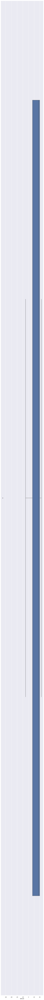

In [778]:
sns.boxplot(x=df_geo['latitude'],data=df_geo)

<AxesSubplot:xlabel='longitude'>

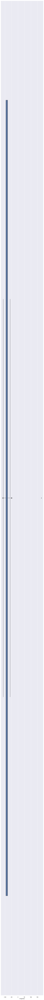

In [779]:
sns.boxplot(x=df_geo['longitude'],data=df_geo)

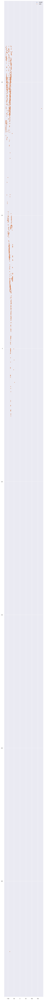

In [780]:
fig, ax = plt.subplots()
groups = df_geo2.groupby('label')
for name, group in groups:
    ax.plot(df_geo2.longitude, df_geo2.latitude, marker='o', linestyle='', markersize = 5, 
label=name)
ax.legend(numpoints=1)
#ax.set_ylim((-200, 200))

In [781]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1693 entries, 0 to 1692
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    1693 non-null   int64         
 1   date                  1690 non-null   datetime64[ns]
 2   time                  629 non-null    object        
 3   continent_code        164 non-null    object        
 4   country_name          1693 non-null   object        
 5   country_code          1693 non-null   object        
 6   state/province        1692 non-null   object        
 7   population            1693 non-null   int64         
 8   city/town             1689 non-null   object        
 9   distance              1692 non-null   float64       
 10  location_description  551 non-null    object        
 11  geolocation           1693 non-null   object        
 12  hazard_type           1693 non-null   object        
 13  landslide_type    

In [782]:
df.describe()[['distance','population']]

,distance,population
count,1692.000000,1.693000e+03
mean,7.822695,9.345940e+04
std,9.358256,5.226016e+05
min,0.000030,0.000000e+00
25%,1.936360,2.080000e+03
50%,4.538635,5.785000e+03
75%,9.873865,1.886700e+04
max,74.460970,1.229419e+07


In [783]:
#Using Scatter Plot
df

,id,date,time,continent_code,country_name,country_code,state/province,population,city/town,distance,location_description,geolocation,hazard_type,landslide_type,landslide_size,trigger,storm_name,injuries,fatalities,source_name,source_link,latitude,longitude
0,34,2007-03-02,Night,NaN,United States,US,Virginia,16000,Cherry Hill,3.40765,Unknown,"(38.6009, -77.2682)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,NBC 4 news,http://www.nbc4.com/news/11186871/detail.html,38.6009,-77.2682
1,42,2007-03-22,NaN,NaN,United States,US,Ohio,17288,New Philadelphia,3.33522,NaN,"(40.5175, -81.4305)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Canton Rep.com,http://www.cantonrep.com/index.php?ID=345054&C...,40.5175,-81.4305
2,56,2007-04-06,NaN,NaN,United States,US,Pennsylvania,15930,Wilkinsburg,2.91977,Urban area,"(40.4377, -79.916)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,The Pittsburgh Channel.com,https://web.archive.org/web/20080423132842/htt...,40.4377,-79.916
3,59,2007-04-14,NaN,NaN,Canada,CA,Quebec,42786,Châteauguay,2.98682,Above river,"(45.3226, -73.7771)",Landslide,Riverbank collapse,Small,Rain,NaN,NaN,NaN,Le Soleil,http://www.hebdos.net/lsc/edition162007/articl...,45.3226,-73.7771
4,61,2007-04-15,NaN,NaN,United States,US,Kentucky,6903,Pikeville,5.66542,Below road,"(37.4325, -82.4931)",Landslide,Landslide,Small,Downpour,NaN,NaN,0.0,Matthew Crawford (KGS),NaN,37.4325,-82.4931
5,64,2007-04-20,NaN,NaN,United States,US,Kentucky,6903,Pikeville,0.23715,NaN,"(37.4814, -82.5186)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Applalachain news-express,http://www.news-expressky.com/articles/2007/04...,37.4814,-82.5186
6,67,2007-04-24,NaN,NaN,United States,US,South Dakota,2540,Dakota Dunes,2.48033,NaN,"(42.4941, -96.4576)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Sioux City Journnal,http://www.siouxcityjournal.com/articles/2007/...,42.4941,-96.4576
7,77,2007-05-21,NaN,SA,Colombia,CO,Risaralda,440118,Pereira,0.62022,NaN,"(4.8081, -75.6941)",Landslide,Mudslide,Large,Rain,NaN,NaN,13.0,Reuters - AlertNet.org,http://www.reuters.com/news/video/videoStory?v...,4.8081,-75.6941
8,105,2007-06-27,NaN,SA,Ecuador,EC,Zamora-Chinchipe,15276,Zamora,0.47714,NaN,"(-4.065, -78.951)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...,-4.065,-78.951
9,106,2007-06-27,NaN,SA,Ecuador,EC,Loja,117796,Loja,0.35649,NaN,"(-3.99, -79.205)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...,-3.99,-79.205


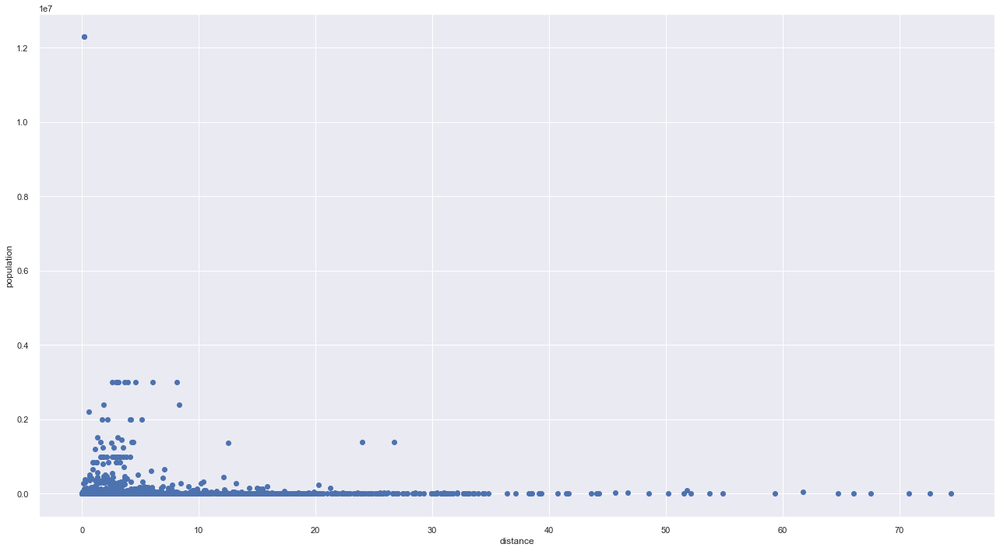

In [784]:
#do you find any outlier regarding "population" and "distance"

# Scatter plot
fig, ax = plt.subplots(figsize = (18,10))
ax.scatter(df['distance'], df['population'])
 
# x-axis label
ax.set_xlabel('distance')
 
# y-axis label
ax.set_ylabel('population')
plt.show()

In [785]:
# Position of the Outlier
print(np.where((df['population']>0.4) & (df['distance']>30)))

(array([  10,   21,   32,   77,  108,  123,  125,  130,  193,  395,  418,
        484,  493,  554,  555,  579,  582,  586,  659,  736,  782,  845,
        893,  909,  921,  943,  983, 1037, 1050, 1058, 1087, 1103, 1104,
       1105, 1109, 1126, 1127, 1133, 1134, 1136, 1140, 1141, 1142, 1152,
       1163, 1164, 1171, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1270,
       1271, 1272, 1281, 1313, 1402, 1465, 1483, 1486, 1547, 1562],
      dtype=int64),)


<AxesSubplot:>

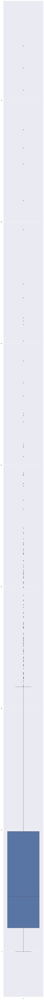

In [786]:
#Using Boxplot
import seaborn as sns
sns.boxplot(df['distance'])

In [787]:
# Position of the Outlier
print(np.where(df['distance']>20))

(array([  10,   20,   21,   32,   64,   77,  100,  108,  121,  122,  123,
        125,  128,  130,  151,  168,  193,  213,  237,  277,  283,  328,
        332,  348,  387,  389,  395,  396,  397,  410,  411,  412,  413,
        418,  438,  466,  484,  493,  510,  518,  554,  555,  579,  582,
        585,  586,  627,  659,  707,  736,  750,  752,  760,  782,  802,
        818,  821,  825,  839,  845,  883,  893,  901,  902,  903,  904,
        909,  921,  938,  943,  955,  983,  993,  997, 1002, 1027, 1036,
       1037, 1047, 1049, 1050, 1051, 1056, 1057, 1058, 1065, 1080, 1081,
       1084, 1086, 1087, 1091, 1100, 1103, 1104, 1105, 1109, 1119, 1125,
       1126, 1127, 1131, 1132, 1133, 1134, 1135, 1136, 1140, 1141, 1142,
       1152, 1163, 1164, 1171, 1182, 1194, 1205, 1213, 1239, 1240, 1260,
       1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271,
       1272, 1273, 1281, 1284, 1289, 1312, 1313, 1330, 1331, 1332, 1355,
       1402, 1403, 1465, 1466, 1483, 1486, 1547, 1

<AxesSubplot:>

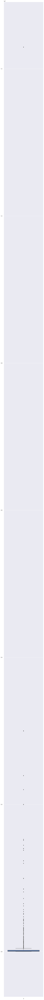

In [788]:
import seaborn as sns
#define figure size
sns.set(rc={"figure.figsize":(6, 130)}) #width=8, height=4
sns.boxplot(df['population'])

In [789]:
print(np.where(df['population']>0.2))

(array([   0,    1,    2, ..., 1690, 1691, 1692], dtype=int64),)


C:\Users\QLRR\AppData\Local\Temp/ipykernel_6044/1873255908.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot( a=df['distance'], hist=True)


<AxesSubplot:xlabel='distance', ylabel='Density'>

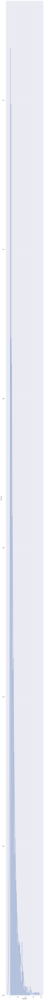

In [790]:
#Using histogram
#import library
import seaborn as sns
#Iris Dataset
#Using distplot function, create a graph
sns.distplot( a=df['distance'], hist=True)

In [791]:
mean=df['distance'].mean()
std=df['distance'].std()
threshold = 3
outlier = [] 
for i in df['distance']: 
    z = (i-mean)/std 
    if z > threshold: 
        outlier.append(i) 
print('outlier in dataset is', outlier) 

outlier in dataset is [64.74594, 54.90196, 50.21741, 41.47439, 67.58127, 61.75306, 51.84125, 38.50248, 36.37629, 38.27504, 46.77007, 52.11489, 72.6468, 37.11379, 41.54001, 45.69792, 51.55941, 39.22402, 38.48521, 41.69882, 39.14705, 40.70609, 39.35619, 44.26251, 70.82902, 66.07162, 59.36537, 44.08725, 74.46097, 48.56269, 53.76298, 43.57781]


C:\Users\QLRR\AppData\Local\Temp/ipykernel_6044/3746995242.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot( a=df['population'], hist=True)


<AxesSubplot:xlabel='population', ylabel='Density'>

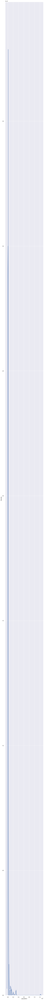

In [792]:
#import library
import seaborn as sns
#Iris Dataset
#Using distplot function, create a graph
sns.distplot( a=df['population'], hist=True)

In [793]:
mean=df['population'].mean()
std=df['population'].std()
threshold = 3
outlier = [] 
for i in df['population']: 
    z = (i-mean)/std 
    if z > threshold: 
        outlier.append(i) 
print('outlier in dataset is', outlier) 

outlier in dataset is [1999979, 1999979, 3000000, 12294193, 2392877, 12294193, 1999979, 3000000, 3000000, 3000000, 3000000, 3000000, 3000000, 3000000, 1999979, 2392877, 2201941, 1999979, 3000000]


In [794]:
df

,id,date,time,continent_code,country_name,country_code,state/province,population,city/town,distance,location_description,geolocation,hazard_type,landslide_type,landslide_size,trigger,storm_name,injuries,fatalities,source_name,source_link,latitude,longitude
0,34,2007-03-02,Night,NaN,United States,US,Virginia,16000,Cherry Hill,3.40765,Unknown,"(38.6009, -77.2682)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,NBC 4 news,http://www.nbc4.com/news/11186871/detail.html,38.6009,-77.2682
1,42,2007-03-22,NaN,NaN,United States,US,Ohio,17288,New Philadelphia,3.33522,NaN,"(40.5175, -81.4305)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Canton Rep.com,http://www.cantonrep.com/index.php?ID=345054&C...,40.5175,-81.4305
2,56,2007-04-06,NaN,NaN,United States,US,Pennsylvania,15930,Wilkinsburg,2.91977,Urban area,"(40.4377, -79.916)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,The Pittsburgh Channel.com,https://web.archive.org/web/20080423132842/htt...,40.4377,-79.916
3,59,2007-04-14,NaN,NaN,Canada,CA,Quebec,42786,Châteauguay,2.98682,Above river,"(45.3226, -73.7771)",Landslide,Riverbank collapse,Small,Rain,NaN,NaN,NaN,Le Soleil,http://www.hebdos.net/lsc/edition162007/articl...,45.3226,-73.7771
4,61,2007-04-15,NaN,NaN,United States,US,Kentucky,6903,Pikeville,5.66542,Below road,"(37.4325, -82.4931)",Landslide,Landslide,Small,Downpour,NaN,NaN,0.0,Matthew Crawford (KGS),NaN,37.4325,-82.4931
5,64,2007-04-20,NaN,NaN,United States,US,Kentucky,6903,Pikeville,0.23715,NaN,"(37.4814, -82.5186)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Applalachain news-express,http://www.news-expressky.com/articles/2007/04...,37.4814,-82.5186
6,67,2007-04-24,NaN,NaN,United States,US,South Dakota,2540,Dakota Dunes,2.48033,NaN,"(42.4941, -96.4576)",Landslide,Landslide,Small,Rain,NaN,NaN,NaN,Sioux City Journnal,http://www.siouxcityjournal.com/articles/2007/...,42.4941,-96.4576
7,77,2007-05-21,NaN,SA,Colombia,CO,Risaralda,440118,Pereira,0.62022,NaN,"(4.8081, -75.6941)",Landslide,Mudslide,Large,Rain,NaN,NaN,13.0,Reuters - AlertNet.org,http://www.reuters.com/news/video/videoStory?v...,4.8081,-75.6941
8,105,2007-06-27,NaN,SA,Ecuador,EC,Zamora-Chinchipe,15276,Zamora,0.47714,NaN,"(-4.065, -78.951)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...,-4.065,-78.951
9,106,2007-06-27,NaN,SA,Ecuador,EC,Loja,117796,Loja,0.35649,NaN,"(-3.99, -79.205)",Landslide,Landslide,Medium,Downpour,NaN,NaN,NaN,Red Cross - Field reports,https://www-secure.ifrc.org/dmis/prepare/view_...,-3.99,-79.205


In [806]:
import pandas as pd
import plotly.express as px


fig = px.scatter_geo(df, lat='latitude', lon='longitude',hover_name="country_name",color = "country_name")

fig.show()

In [808]:
import numpy as np

import pandas as pd

import matplotlib.pyplot as plt

%matplotlib inline

from sklearn.ensemble import IsolationForest
new_data=df[['latitude','longitude']]
iso_forest = IsolationForest(n_estimators=300, contamination=0.10)
iso_forest = iso_forest .fit(new_data)

ImportError: DLL load failed while importing lapack_lite: The specified module could not be found.